# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 

**Desciption:** This projects aims to create a lane detector for given video inputs.  
**Approach:** Initially, heuristic approach is used to detect optimum parameters then those parameters are used in the pipeline.  

The pipeline is given below.

**The pipeline** is described as follows:

1. Camera Calibration
    * Finding Camera Matrix and Distortion Coefficients
    * Distortion Correction
2. Gradients & Color Space Transform
3. Perspective Transform
4. Lane Pixel Detection
    * Part 1: Histogram
    * Part 2: Sliding Windows Search
    * Part 3: Searching Around a Previously Detected Line
5. Image Augmentation

#### Importing Required Libraries

In [1]:
import cv2
import glob
import pickle
import numpy as np
import PIL
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

### 1. Camera Calibration

#### Checking the first checkerboard image

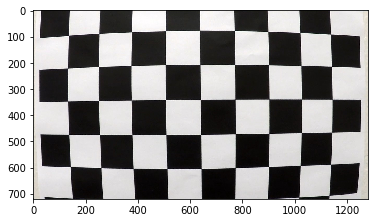

In [2]:
files = glob.glob('./camera_cal/calibration*.jpg')
img1 = mpimg.imread(sorted(files)[0])
plt.imshow(img1)

In [3]:
# To display the results in a window use --> %matplotlib qt

# Chessboard size
nx, ny = 9, 6

# Arrays to store 'object points' & 'image points'
objpoints = [] #3D points in "real world" space
imgpoints = [] #2D points in image plane

# Prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x,y coords

# Reading images
checkerboards = glob.glob('./camera_cal/calibration*.jpg')
imshape = img1.shape

detected_corners = []

# Iterating images
for fname in checkerboards:
    img = mpimg.imread(fname) #read in each image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #convert image to grayscale
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None) #find the chessboard corners
        
    # If corners found: Add object points, image points
    if ret==True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # Drawing corners (optional)
        drawCb = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        detected_corners.append(drawCb)

# Calibrating camera and finding the camera matrix and the distortion coefficients
ret, cameraMatrix, distortionCoeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape[:2],None,None)

def get_undistorted(img):
    undistorted = cv2.undistort(img, cameraMatrix, distortionCoeffs, None, cameraMatrix)
    return undistorted

#### Drawing the Corners

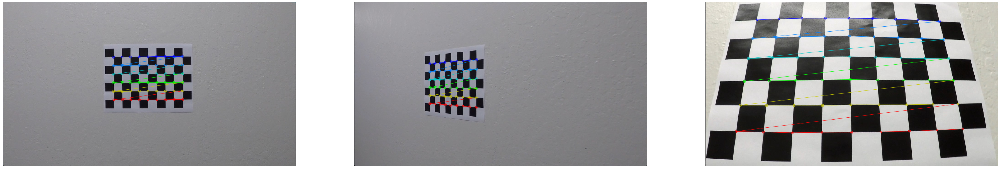

In [4]:
plt.figure(figsize=(64,36))

plt.subplot(131), plt.imshow(detected_corners[0])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(detected_corners[1])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(detected_corners[2])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.show() #to block out the text output!

#### Testing the Distortion Correction

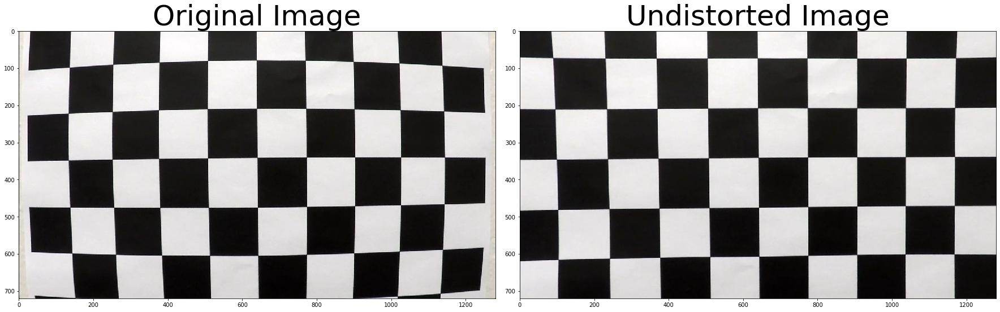

In [5]:
cb = mpimg.imread(checkerboards[6])
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cb)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(get_undistorted(cb))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 2. Gradients & Color Space Transforms

**NOTE**: Following cells contain to many lines of codes and plots since I obtain my optimum thresholding parameters. You may fell free to skip those cells by clicking the link below, it will directly take you away to the cell where ı present my findings as a conclusion:  
[Skip to conclusion!](#sobel_color_conclusion)

#### 2.1 Gradient Transforms

In [6]:
class get_grad_thresholded:
    '''
    This tool do the following operations on a given image:
    1. Applying Sobel
    2. Magnitude of the Gradient
    3. Direction of the Gradient
    Then returns the thresholded grad. dir.
    '''
    def __init__(self,
                 orient='x',
                 sobel_kernel=3,
                 sobel_th_min=0,
                 sobel_th_max=255,
                 mag_th_min=0,
                 mag_th_max=0,
                 dir_th_min=0,
                 dir_th_max=np.pi/2,
                 turn_gray='yes'):
        self.orient = orient
        self.sobel_kernel = sobel_kernel
        self.sobel_th_min = sobel_th_min
        self.sobel_th_max = sobel_th_max
        self.mag_th_min = mag_th_min
        self.mag_th_max = mag_th_max
        self.dir_th_min = dir_th_min
        self.dir_th_max = dir_th_max
        self.turn_gray = turn_gray
        

    def abs_sobel_thresh(self, image, orient, sobel_kernel, sobel_th_min, sobel_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Apply x or y gradient with the OpenCV Sobel() function
        # and take the absolute value
        if orient == 'x':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
        if orient == 'y':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))

        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

        # Create a copy and apply the threshold
        grad_binary = np.zeros_like(scaled_sobel)

        # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
        grad_binary[(scaled_sobel >= sobel_th_min) & (scaled_sobel <= sobel_th_max)] = 1

        # Return the result    
        return grad_binary


    def mag_thresh(self, image, sobel_kernel, mag_th_min, mag_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Take both Sobel x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx**2 + sobely**2)

        # Rescale to 8 bit
        scale_factor = np.max(gradmag)/255 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 

        # Create a binary image of ones where threshold is met, zeros otherwise
        mag_binary = np.zeros_like(gradmag)
        mag_binary[(gradmag >= mag_th_min) & (gradmag <= mag_th_min)] = 1

        # Return the result  
        return mag_binary

    
    def dir_threshold(self, image, sobel_kernel, dir_th_min, dir_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Calculate the x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # Take the absolute value of the gradient direction, 
        # apply a threshold, and create a binary image result
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir >= dir_th_min) & (absgraddir <= dir_th_max)] = 1

        # Return the result     
        return dir_binary
    
grTran = get_grad_thresholded()

#### Loading Test Images

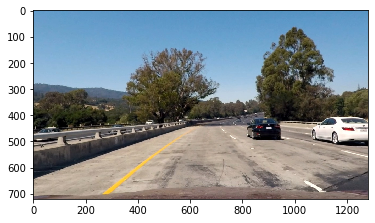

In [7]:
i=0 #change it
test_images = sorted(glob.glob('./test_images/test*.jpg'))
cv2.undistort(cb, cameraMatrix, distortionCoeffs, None, cameraMatrix)
test_img = mpimg.imread(test_images[i])
test_img = get_undistorted(test_img)
plt.imshow(test_img)
plt.show() #to block out the text output!

In [8]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = grTran.abs_sobel_thresh(test_img, 'x', ksize, 10, 200, turn_gray='yes')
grady = grTran.abs_sobel_thresh(test_img, 'y', ksize, 20, 100, turn_gray='yes')
mag_binary = grTran.mag_thresh(test_img, ksize, 20, 100, turn_gray='yes')
dir_binary = grTran.dir_threshold(test_img, 15, 0.7, 1.3, turn_gray='yes')

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

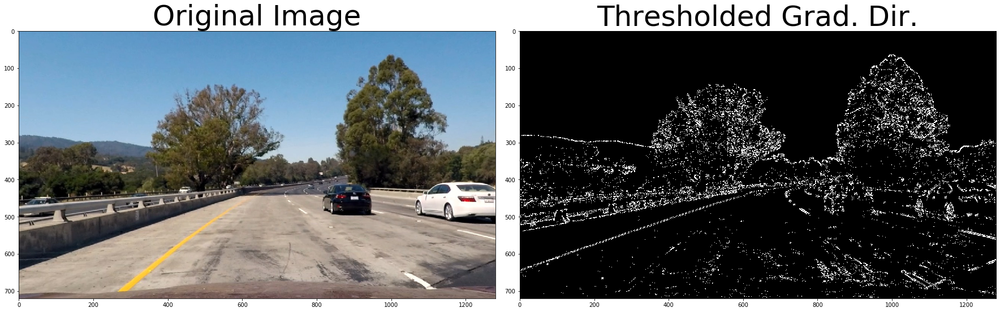

In [9]:
# Plot the test result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 2.2 Color Transforms

In [10]:
class colorTransforms:
    
    def __init__(self,
                 thresh=(180, 255),
                 channel='R',
                 space='RGB'):
        self.thresh = thresh
        self.channel = channel
        self.space = space
    

    ##### COMBINED FUNCTIONS ##### 
    def compare_org_gray_graybin(self,image,space):
        if(space=='RGB'):
            self.rgb_gray_graybin(image,space)
        if(space=='HLS'):
            self.hls_gray_graybin(image,space)
            
            
    ##### RGB FUNCTIONS #####    
    def rgb_gray_graybin(self, image, space):
        # Gray scale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # Gray binary
        binary_gray = np.zeros_like(gray)
        binary_gray[(gray > self.thresh[0]) & (gray <= self.thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(image, cmap="gray")
        title1=space+" Space"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(gray, cmap="gray")
        title2=space+" Space (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=space+" Space Binary"
        plt.subplot(133), plt.imshow(binary_gray, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def rgb_ingray(self, image):
        R = image[:,:,0]
        G = image[:,:,1]
        B = image[:,:,2]

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(R, cmap="gray")
        plt.title("R", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(G, cmap="gray")
        plt.title("G", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(133), plt.imshow(B, cmap="gray")
        plt.title("B", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def rgb_rgbbin(self, image, channel):
        R,G,B = image[:,:,0], image[:,:,1], image[:,:,2]
         
        if(channel=='R'):chan=R
        if(channel=='G'):chan=G
        if(channel=='B'):chan=B
        
        # Color binary
        thresh = (200, 255)
        binary_chan = np.zeros_like(chan)
        binary_chan[(chan > thresh[0]) & (chan <= thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))
        
        plt.subplot(131), plt.imshow(chan)
        title1=channel+" Channel"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(chan, cmap="gray")
        title2=channel+" Channel (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=channel+" Binary"
        plt.subplot(133), plt.imshow(binary_chan, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    ##### HLS FUNCTIONS #####
    def hls_gray_graybin(self, image, space):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

        # Gray scale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # Gray binary
        binary_gray = np.zeros_like(gray)
        binary_gray[(gray > self.thresh[0]) & (gray <= self.thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(image, cmap="gray")
        title1=space+" Space"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(gray, cmap="gray")
        title2=space+" Space (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        title3=space+" Space Binary"
        plt.subplot(133), plt.imshow(binary_gray, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!

    
    def hls_ingray(self, image):
        # Converting RGB image into HLS space
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H,L,S = hls[:,:,0], hls[:,:,1], hls[:,:,2]

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(H, cmap="gray")
        plt.title("H", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(L, cmap="gray")
        plt.title("L", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(133), plt.imshow(S, cmap="gray")
        plt.title("S", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def hls_hlsbin(self, image, channel):
        # Converting RGB image into HLS space
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H,L,S = hls[:,:,0], hls[:,:,1], hls[:,:,2]
         
        if(channel=='H'):chan=H
        if(channel=='L'):chan=L
        if(channel=='S'):chan=S
        
        # Color binary
        thresh = (200, 255)
        binary_chan = np.zeros_like(chan)
        binary_chan[(chan > thresh[0]) & (chan <= thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))
        
        plt.subplot(131), plt.imshow(chan)
        title1=channel+" Channel"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(chan, cmap="gray")
        title2=channel+" Channel (Gray)"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=channel+" Binary"
        plt.subplot(133), plt.imshow(binary_chan, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
colTran = colorTransforms()

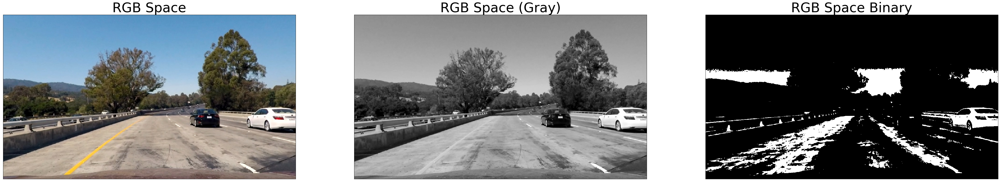

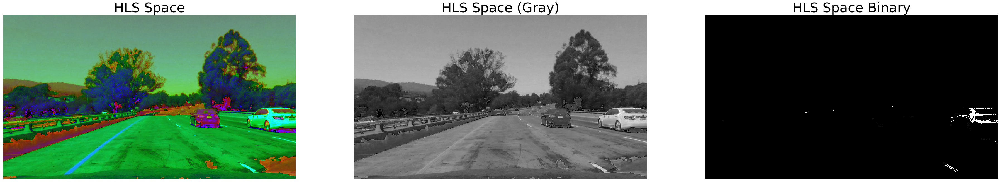

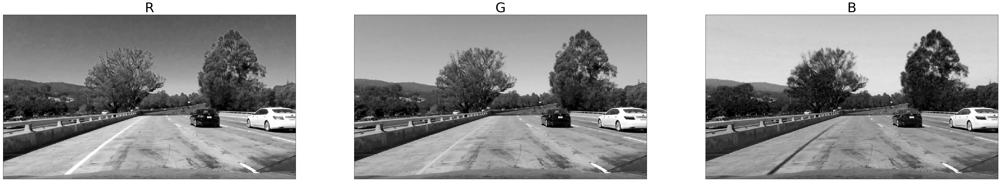

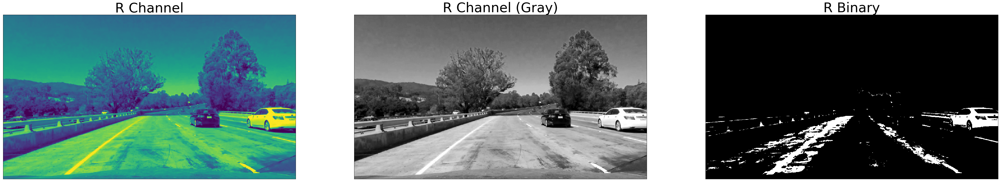

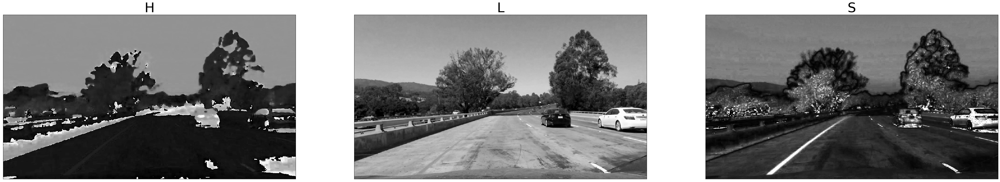

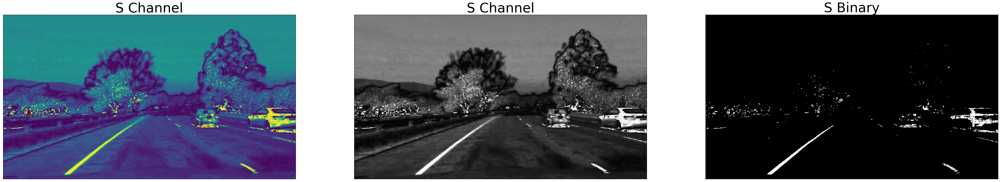

In [11]:
colTran.compare_org_gray_graybin(test_img,space='RGB')
colTran.compare_org_gray_graybin(test_img,space='HLS')
colTran.rgb_ingray(test_img)
colTran.rgb_rgbbin(test_img, channel='R') #channel can be 'R' or 'G' or 'B'
colTran.hls_ingray(test_img)
colTran.hls_hlsbin(test_img, channel='S') #channel can be 'H' or 'L' or 'S'

<a id='sobel_color_conclusion'></a>
#### Conclusion:
With the huristic approach, appropriate gradient and color conversion values were determined.  
The S channel is still doing a fairly robust job of picking up the lines under very different color and contrast conditions, while the other selections look messy.  
In general, the **S channel is preferable** because it is **more robust to changing conditions**.

It's worth noting, however, that **the R channel still does rather well on the white lines**, perhaps even better than the S channel.
In addition, **L channel** is performed well for the edges generated due to shadows.
As with gradients, it's worth considering how you might combine various color thresholds to make the most robust identification of the lines.  

Now, we cam create a function that creates a combined transforms of sobel and color.

#### Combined Sobel & Color-Space Transform

In [12]:
def combined_sobel_color_transform(img):

    # Convert to grayscale
    gray = cv2.cvtColor(get_undistorted(img), cv2.COLOR_RGB2GRAY)
    h,w = gray.shape
    
    # Gradient threshold on horizontal gradient
    thresh_min, thresh_max = 20, 200
    sobel_x = abs_sobel_thresh(gray, 'x', thresh_min, thresh_max)
    
    # Gradient direction threshold to create a binary mask
    thresh_dir=(np.pi/6, np.pi/2)
    dir_binary = dir_threshold(gray, thresh=thresh_dir)
    
    # Combining the gradients
    combined_condition = ((sobel_x == 1) & (dir_binary == 1))
    
    # R & G thresholds to detect yellow lanes
    color_threshold = 137.5
    R,G = img[:,:,0], img[:,:,1]
    color_combined = np.zeros_like(R)
    rg_condition = (R > color_threshold) & (G > color_threshold)
    
    # HLS thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L,S = hls[:,:,1], hls[:,:,2]
    
    # S channel to detect white and yellow lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # L channel is performed well for the edges generated due to shadows
    l_thresh = (125, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # Combined color mask to detect whether color of a pixel near to yellow or white
    color_combined[(rg_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # Determining the region of interest
    roi = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,h-1], [w/2, int(0.5*h)], [w-1, h-1]], dtype=np.int32)
    cv2.fillPoly(roi, [region_of_interest_vertices], 1)
    combined_sct = cv2.bitwise_and(color_combined, roi)
    
    return combined_sct
    
def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    max_value = np.max(abs_sobel)
    binary_output = np.uint8(255*abs_sobel/max_value)
    threshold_mask = np.zeros_like(binary_output)
    threshold_mask[(binary_output >= thresh_min) & (binary_output <= thresh_max)] = 1
    return threshold_mask

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Horizontal and Vertical Gradients
    abs_sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Calculating the direction of the gradient
    direction = np.arctan2(abs_sobel_y,abs_sobel_x)
    direction = np.absolute(direction)
    # Creating binary image in the threshold boundaries
    mask = np.zeros_like(direction)
    mask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return mask

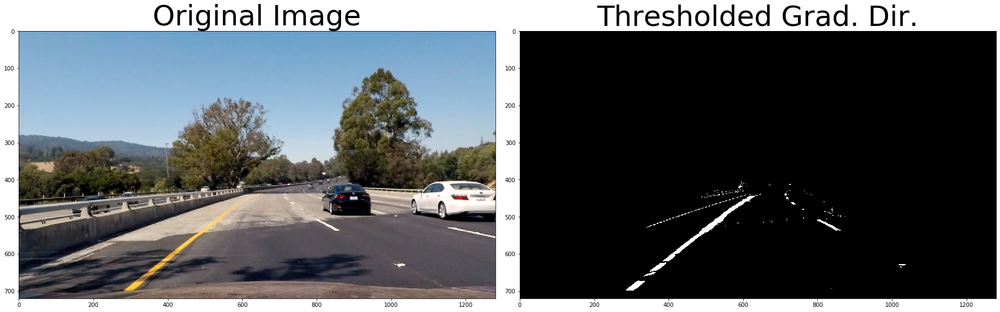

In [13]:
# Plot the test result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

i=3
test_img = mpimg.imread(test_images[i])
test_img = get_undistorted(test_img)
combined_sct=combined_sobel_color_transform(test_img)

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_sct, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 3. Perspective Transform

In [18]:
def perspective_transform(img):
    h,w = img.shape[0], img.shape[1]
    
    # The coordinates of quadrangle vertices in the initial image
    i1,i2,i3,i4 = [w // 2 - 75, h*0.625], [w // 2 + 75,h*0.625], [-100,h], [w+100,h]
    img_in = np.float32([i1,i2,i3,i4])
    
    # The coordinates of quadrangle vertices in the target image
    t1,t2,t3,t4 = [100,0], [w-100,0], [100,h], [w-100,h]
    img_tar = np.float32([t1,t2,t3,t4])
    
    # The perspective transform matrix
    Mpt = cv2.getPerspectiveTransform(img_in, img_tar)
    
    # Warping the image
    img_warped = cv2.warpPerspective(img, Mpt, (w,h))
    
    # Unwarping
    unwarp = cv2.getPerspectiveTransform(img_in,img_tar)
    
    return (img_warped,unwarp)

Image: ./test_images/test1.jpg


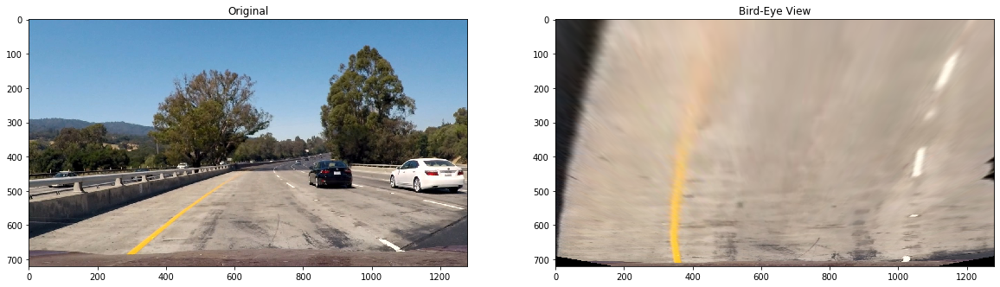

Image: ./test_images/test2.jpg


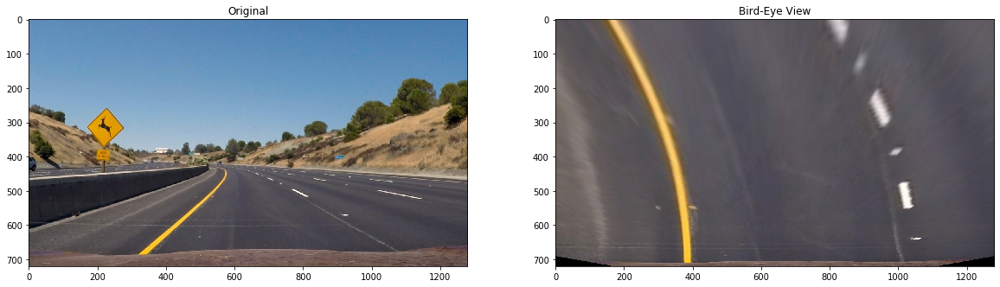

Image: ./test_images/test3.jpg


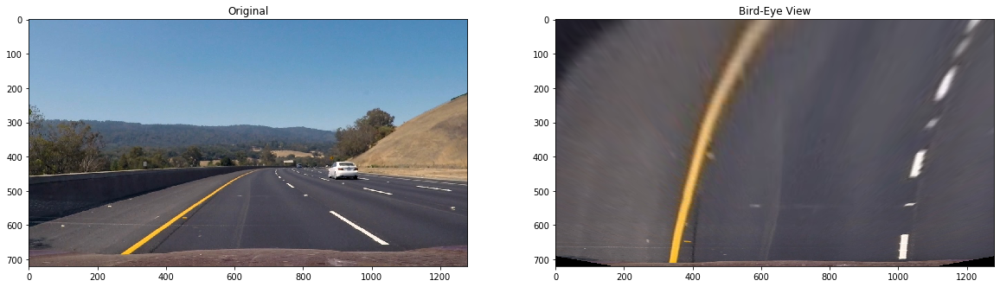

Image: ./test_images/test4.jpg


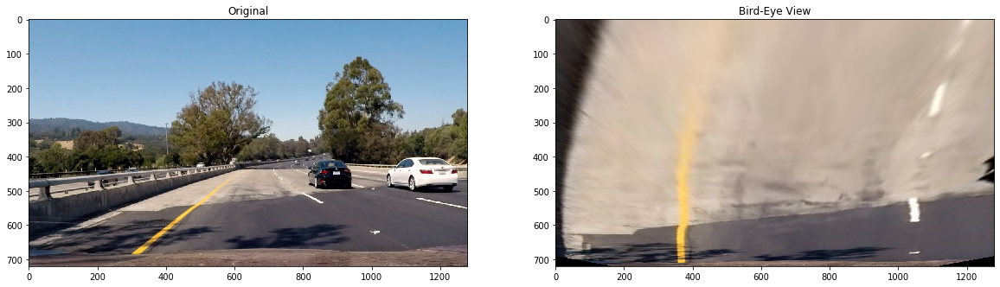

Image: ./test_images/test5.jpg


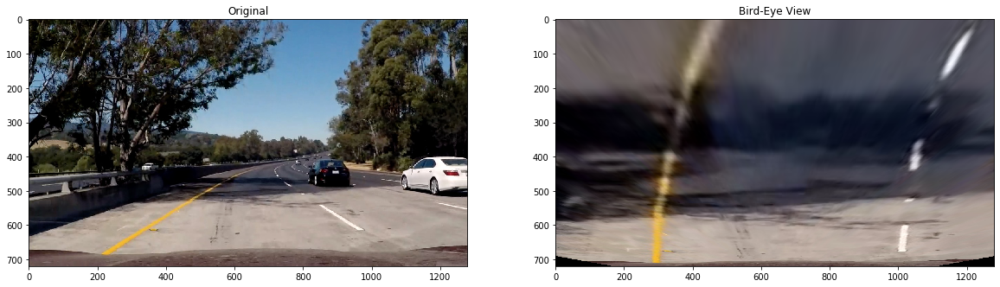

Image: ./test_images/test6.jpg


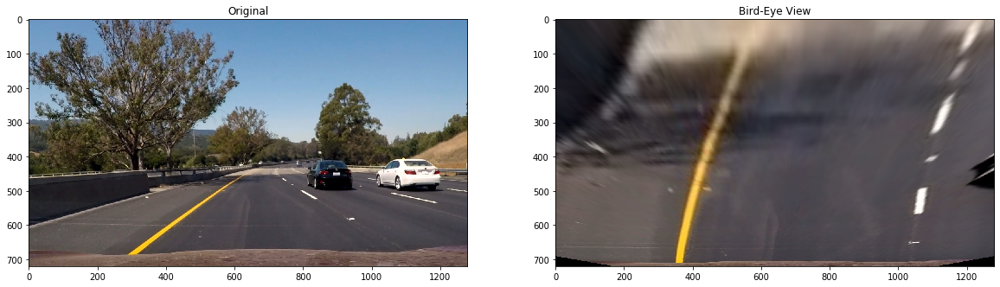

In [19]:
# Plotting thresholded images
for i, path, in enumerate(test_images):
    print("Image: " + test_images[i])
    img = mpimg.imread(test_images[i])
    birdeye, _ = perspective_transform(img) 
    
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
    ax2.set_title('Bird-Eye View')
    ax2.imshow(birdeye)
    plt.show()

### 4. Lane Pixel Detection

After applying calibration, thresholding, and a perspective transform to a road image, a binary image where the lane lines stand out clearly is created.  
In this section, it's decided explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.  
Plotting a **histogram** of where the binary activations occur across the image is one potential solution for this.

#### Lane Pixel Detection - Part 1: Histogram

In [28]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

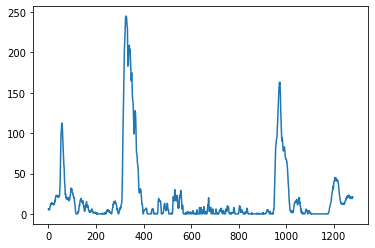

In [29]:
# Load our image
img = mpimg.imread('./test_images_2/warped-example.jpg')/255 #255 for normalizing

# Create histogram of image binary activations
histogram = hist(img)

# Visualize the resulting histogram
plt.plot(histogram)
plt.show() #to block text output

Take a histogram along all the columns in the lower half of the image like this:

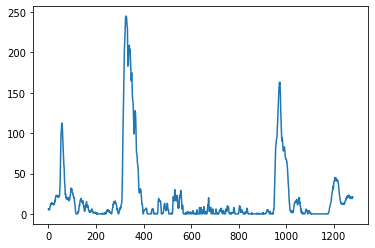

In [30]:
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.show() #to block text output

The two highest peaks from the histogram can be used as a starting point for determining where the lane lines are, and then use sliding windows moving upward in the image (further along the road) to determine where the lane lines go.

#### Lane Pixel Detection - Part 2: Sliding Windows Search

With this histogram we are adding up the pixel values along each column in the image. In our thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. We can use that as a starting point for where to search for the lines. From that point, we can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.

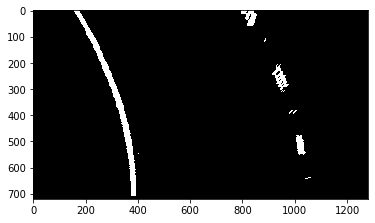

In [64]:
i=1
test_img = mpimg.imread(test_images[i])
undistorted_img = get_undistorted(test_img)
thresholded_img = combined_sobel_color_transform(test_img)
binary_warped, _ = perspective_transform(thresholded_img)

plt.imshow(warped_binary, cmap='gray')
plt.show() #to block out the text output!

The first step to take is to **split the histogram into two sides**, one for each lane line.

In [39]:
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

In [40]:
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Set height of windows - based on nwindows above and image shape
window_height = np.int(binary_warped.shape[0]//nwindows)
# Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated later for each window in nwindows
leftx_current = leftx_base
rightx_current = rightx_base

# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

In [47]:
# Loading image
#binary_warped = mpimg.imread('./test_images_2/warped-example.jpg')

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img

#out_img = fit_polynomial(binary_warped)
#plt.imshow(out_img)

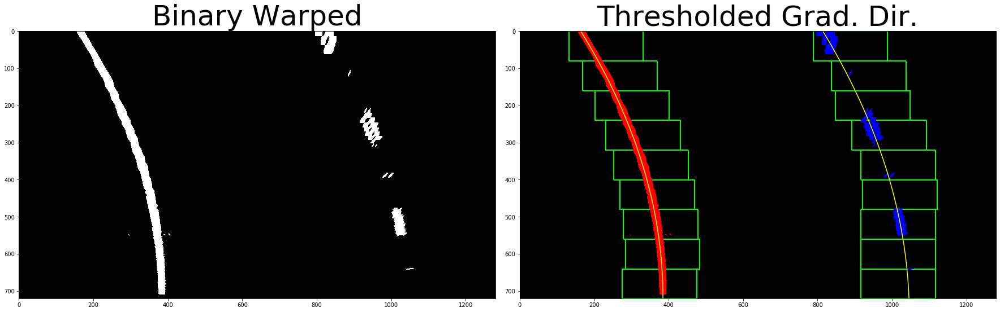

In [48]:
# Plot the test result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(binary_warped, cmap='gray')
ax1.set_title('Binary Warped', fontsize=50)
ax2.imshow(fit_polynomial(binary_warped), cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Lane Pixel Detection - Part 3: Searching Around a Previously Detected Line

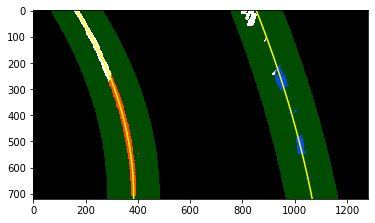

In [59]:
# Loading image
#binary_warped = mpimg.imread('./test_images_2/warped-example.jpg')

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
result = search_around_poly(binary_warped)

# View your output
plt.imshow(result)

### 5. Image Augmentation

In [60]:
def generate_data():
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    
    return ploty, left_fit, right_fit

#### Measuring Curvature (Pixels)

In [61]:
def measure_curvature_pixels():
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit, right_fit = generate_data()
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels()

print(left_curverad, right_curverad)
# Should see values of 1625.06 and 1976.30 here, if using
# the default `generate_data` function with given seed number

1625.0601831657266 1976.2967307714825


#### Measuring Curvature (Real-World)

In [67]:

def generate_data(ym_per_pix, xm_per_pix):
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return ploty, left_fit_cr, right_fit_cr
    
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    ploty, left_fit_cr, right_fit_cr = generate_data(ym_per_pix, xm_per_pix)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad


# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad = measure_curvature_real()

print(left_curverad, 'm', right_curverad, 'm')
# Should see values of 533.75 and 648.16 here, if using
# the default `generate_data` function with given seed number

533.7525889210908 m 648.1574851434397 m


#### Drawing Lane Area

In [66]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
plt.imshow(result)

NameError: name 'left_fitx' is not defined

### The Pipeline

#### Applying the pipeline to the test images

In [72]:
for image_path in glob.glob('test_images/test*.jpg'):
    img = mpimg.imread(image_path)
    undistorted = get_undistorted(img) 
    pipeline = Pipeline(undistorted)
    overlay = pipeline.run(undistorted)
    
    mpimg.imsave(image_path.replace('test_images', 'output_images'), overlay)
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay)
    plt.subplots_adjust(left=0.0, right=1, top=0.9, bottom=0.0)
    plt.show()

NameError: name 'calibrated_camera' is not defined

#### Applying the pipeline to the test images

In [73]:
from moviepy.editor import VideoFileClip

def build_augmented_video(video_path_prefix):
    output_video_name = 'videos/{}_augmented.mp4'.format(video_path_prefix)
    input_video = VideoFileClip("videos/{}.mp4".format(video_path_prefix))

    calibrated = calibrated_camera(input_video.get_frame(0)) 
    pipeline = Pipeline(calibrated)

    output_video = input_video.fl_image(pipeline.run)

    %time output_video.write_videofile(output_video_name, audio=False)

In [74]:
build_augmented_video('project_video')

OSError: MoviePy error: the file videos/project_video.mp4 could not be found!
Please check that you entered the correct path.

In [75]:
build_augmented_video('challenge_video')

OSError: MoviePy error: the file videos/challenge_video.mp4 could not be found!
Please check that you entered the correct path.

In [76]:
build_augmented_video('harder_challenge_video')

OSError: MoviePy error: the file videos/harder_challenge_video.mp4 could not be found!
Please check that you entered the correct path.

#### Creating Gif Images for Writeup

In [77]:
def gif_from_video(video_path_prefix, s=(0,0), f=(0,15)):
    video_file = 'videos/{}_augmented.mp4'.format(video_path_prefix)
    
    clip = (VideoFileClip(video_file).subclip(s,f).resize(0.5))
    %time clip.write_gif('videos/{}_augmented.gif'.format(video_path_prefix), fps=10)

In [78]:
gif_from_video('project_video',s=(0, 15), f=(0,40))

OSError: MoviePy error: the file videos/project_video_augmented.mp4 could not be found!
Please check that you entered the correct path.

In [79]:
gif_from_video('challenge_video', s=(0,6), f=(0,16))

OSError: MoviePy error: the file videos/challenge_video_augmented.mp4 could not be found!
Please check that you entered the correct path.